# Xenium (in situ sequencing)

## Data download

Download the data from here:
https://www.10xgenomics.com/resources/datasets/human-kidney-preview-data-xenium-human-multi-tissue-and-cancer-panel-1-standard

Which data is provided?
Which data is needed for the first analysis?

## Data loading

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
from anndata import AnnData
from typing import Union, Dict, Optional
from matplotlib import pyplot as plt
from pathlib import Path
import os
from PIL import Image
import seaborn as sns

In [2]:
def ReadXenium(
    feature_cell_matrix_file: Union[str, Path],
    cell_summary_file: Union[str, Path],
    image_path: Optional[Path] = None,
    library_id: str = None,
    scale: float = 1.0,
    quality: str = "hires",
    spot_diameter_fullres: float = 15,
    #background_color: _background = "white",
) -> AnnData:

    """\
    Read Xenium data

    Parameters
    ----------
    feature_cell_matrix_file
        Path to feature cell count matrix file. Only support h5ad file now.
    cell_summary_file
        Path to cell summary CSV file.
    image_path
        Path to image. Only need when loading full resolution image.
    library_id
        Identifier for the visium library. Can be modified when concatenating multiple adata objects.
    scale
        Set scale factor.
    quality
        Set quality that convert to stlearn to use. Store in anndata.obs['imagecol' & 'imagerow']
    spot_diameter_fullres
        Diameter of spot in full resolution
    background_color
        Color of the backgound. Only `black` or `white` is allowed.
    Returns
    -------
    AnnData
    """

    metadata = pd.read_csv(cell_summary_file)

    adata = sc.read_10x_h5(feature_cell_matrix_file)

    spatial = metadata[["x_centroid", "y_centroid"]]
    metadata.set_index(adata.obs_names, inplace=True)
    adata.obs = metadata.copy()
    adata.uns["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()
    spatial.columns = ["imagecol", "imagerow"]

    adata.obsm["spatial"] = spatial.values

    if scale == None:
        max_coor = np.max(adata.obsm["spatial"])
        scale = 2000 / max_coor

    if library_id is None:
        library_id = "Xenium_data"

    adata.obs["imagecol"] = spatial["imagecol"].values * scale
    adata.obs["imagerow"] = spatial["imagerow"].values * scale

    if image_path != None:
        add_image(
            adata,
            library_id=library_id,
            quality=quality,
            imgpath=image_path,
            scale=scale,
        )
    else:
        # Create image
        max_size = np.max([adata.obs["imagecol"].max(), adata.obs["imagerow"].max()])
        max_size = int(max_size + 0.1 * max_size)

        #if background_color == "black":
        #    image = Image.new("RGBA", (max_size, max_size), (0, 0, 0, 0))
        #else:
        image = Image.new("RGBA", (max_size, max_size), (255, 255, 255, 255))
        imgarr = np.array(image)

        # Create spatial dictionary
        adata.uns["spatial"] = {}
        adata.uns["spatial"][library_id] = {}
        adata.uns["spatial"][library_id]["images"] = {}
        adata.uns["spatial"][library_id]["images"][quality] = imgarr
        adata.uns["spatial"][library_id]["use_quality"] = quality
        adata.uns["spatial"][library_id]["scalefactors"] = {}
        adata.uns["spatial"][library_id]["scalefactors"][
            "tissue_" + quality + "_scalef"
        ] = scale
        adata.uns["spatial"][library_id]["scalefactors"][
            "spot_diameter_fullres"
        ] = spot_diameter_fullres

    return adata

In [3]:
adata = ReadXenium(feature_cell_matrix_file="Xenium_V1_hKidney_nondiseased_section_outs/cell_feature_matrix.h5",
                     cell_summary_file="Xenium_V1_hKidney_nondiseased_section_outs/cells.csv.gz",
                     library_id="Xenium_V1_hKidney",
                     #image_path="Xenium_V1_hKidney_nondiseased_section_he_image.ome.tif",
                     scale=1,
                     spot_diameter_fullres=15)

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


## QC

In [4]:
adata

AnnData object with n_obs × n_vars = 97560 × 377
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'imagecol', 'imagerow'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [5]:
adata.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,imagecol,imagerow
aaabbkjn-1,aaabbkjn-1,2701.267822,862.046753,213,0,0,0,0,213,272.337354,19.462344,2701.267822,862.046753
aaabgihg-1,aaabgihg-1,2706.506836,852.597229,152,0,0,0,0,152,117.677192,19.642969,2706.506836,852.597229
aaabmoge-1,aaabmoge-1,2710.570068,844.896240,30,0,0,0,0,30,75.681878,19.552657,2710.570068,844.896240
aaabneib-1,aaabneib-1,2712.681152,869.511169,133,0,0,0,0,133,198.642351,43.666095,2712.681152,869.511169
aaachpmg-1,aaachpmg-1,2718.517334,853.341370,87,0,0,0,0,87,132.804536,27.545313,2718.517334,853.341370
...,...,...,...,...,...,...,...,...,...,...,...,...,...
oijanadm-1,oijanadm-1,1827.865723,2586.403564,55,0,0,0,0,55,159.943443,18.875313,1827.865723,2586.403564
oijaoomm-1,oijaoomm-1,1826.323364,2600.750488,22,0,0,1,0,23,419.320953,13.862969,1826.323364,2600.750488
oijbomce-1,oijbomce-1,1832.078369,2574.417236,106,0,0,0,0,106,119.618911,38.608595,1832.078369,2574.417236
oijephgj-1,oijephgj-1,4617.170410,2645.665039,0,0,0,0,0,0,938.979097,17.204532,4617.170410,2645.665039


/var/folders/lx/sv1ghxqx5_q6s4byc0rl91p00000gn/T/ipykernel_72560/2757355619.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
/var/folders/lx/sv1ghxqx5_q6s4byc0rl91p00000gn/T/ipykernel_72560/2757355619.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.

<AxesSubplot: xlabel='cell_area'>

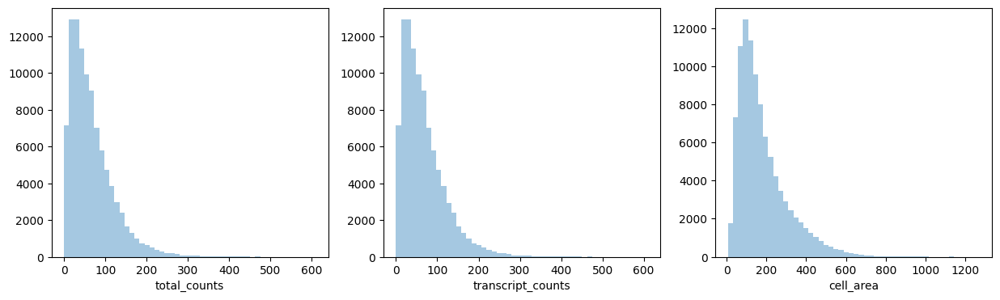

In [6]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["transcript_counts"], kde=False, ax=axs[1])
sns.distplot(adata.obs["cell_area"], kde=False, ax=axs[2])


## Data processing

In [7]:
# Filter genes and cells with at least 10 counts
sc.pp.filter_genes(adata, min_counts=10)
sc.pp.filter_cells(adata,min_counts=10)

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [8]:
# Store the raw data
adata.raw = adata

In [9]:
# Normalization data
sc.pp.normalize_total(adata)

In [10]:
sc.pp.log1p(adata)

## Data analysis

In [11]:
sc.tl.pca(adata, svd_solver='arpack')

In [12]:
sc.pp.neighbors(adata,n_neighbors=25,use_rep='X_pca',random_state=0)


In [13]:
sc.tl.leiden(adata, resolution=0.8)

In [14]:
sc.tl.umap(adata)

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


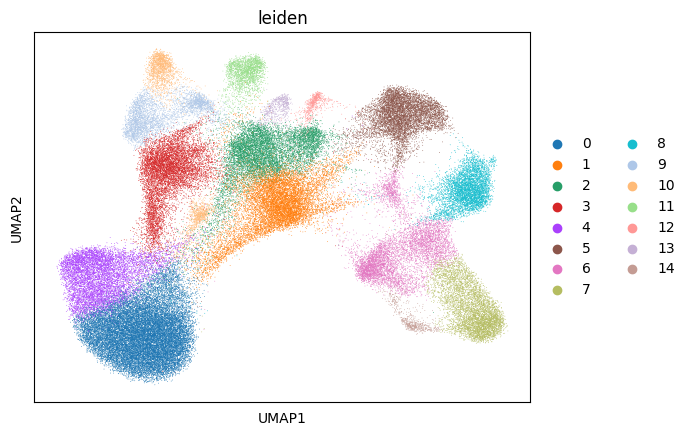

In [15]:
sc.pl.umap(adata, color=['leiden'])

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


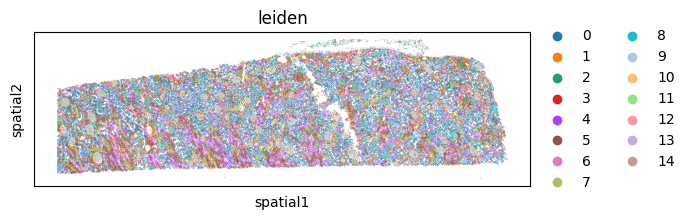

In [16]:
sc.pl.spatial(
    adata,
    color=['leiden'],)

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


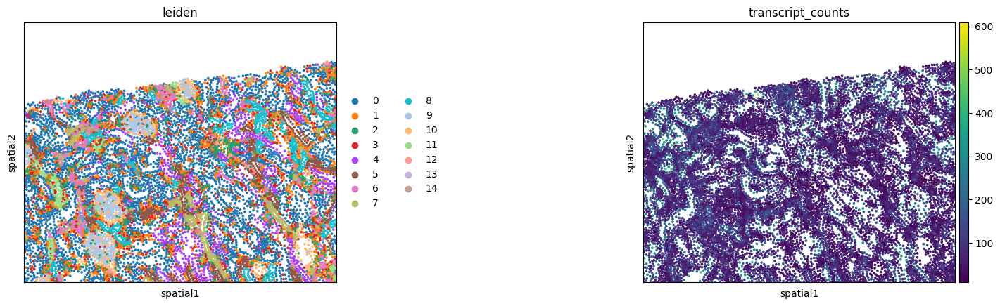

In [ ]:
sc.pl.spatial(
    adata,
    color=['leiden', 'transcript_counts'],
    wspace=0.4, crop_coord=[200,2000,500,2000])

In [ ]:
adata.obs["leiden"].value_counts()

## Marker gene expression

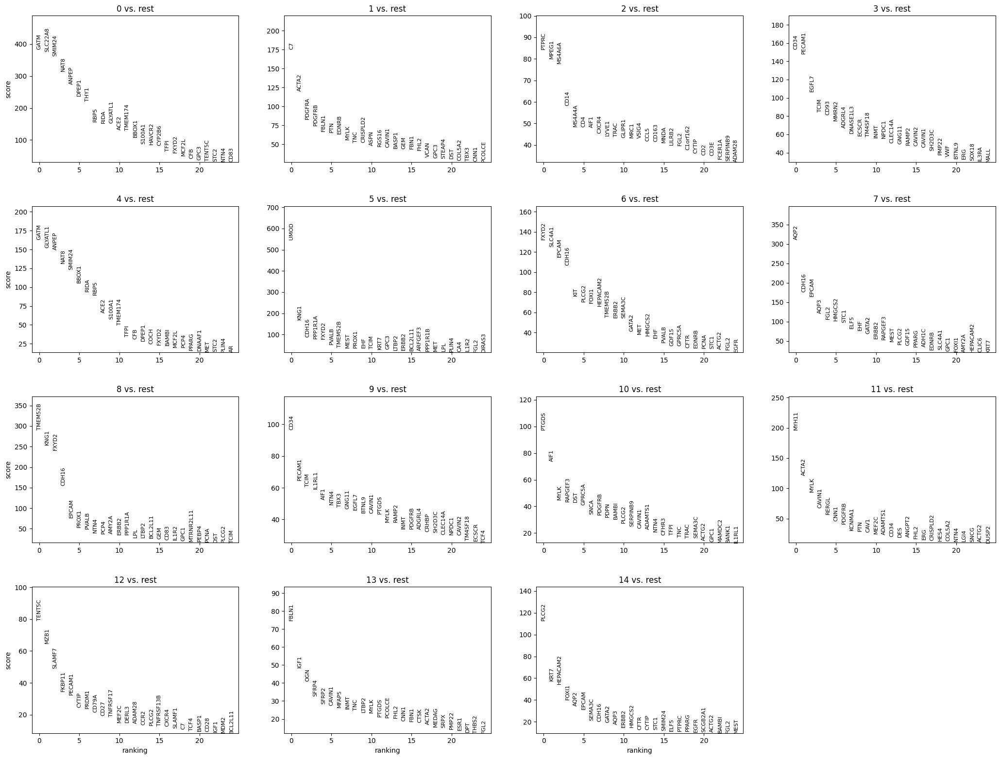

In [19]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [20]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,GATM,C7,PTPRC,CD34,GATM,UMOD,FXYD2,AQP2,TMEM52B,CD34,PTGDS,MYH11,TENT5C,FBLN1,PLCG2
1,SLC22A8,ACTA2,MPEG1,PECAM1,GLYATL1,KNG1,SLC4A1,CDH16,KNG1,PECAM1,AIF1,ACTA2,MZB1,IGF1,KRT7
2,SMIM24,PDGFRA,MS4A6A,EGFL7,ANPEP,CDH16,EPCAM,EPCAM,FXYD2,TCIM,MYLK,MYLK,SLAMF7,OGN,HEPACAM2
3,NAT8,PDGFRB,CD14,TCIM,NAT8,PPP1R1A,CDH16,AQP3,CDH16,IL1RL1,RAPGEF3,CAVIN1,FKBP11,SFRP4,FOXI1
4,ANPEP,FBLN1,MS4A4A,CD93,SMIM24,FXYD2,KIT,FGL2,EPCAM,AIF1,DST,RERGL,PECAM1,SFRP2,AQP2


/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_anndata.py:770: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[groupby]):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldc

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a fu

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a fu

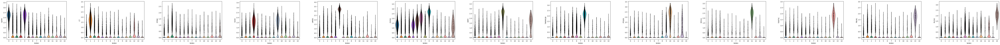

In [ ]:
marker = adata.uns['rank_genes_groups']['names'][0]
sc.pl.violin(adata, marker, groupby='leiden')

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


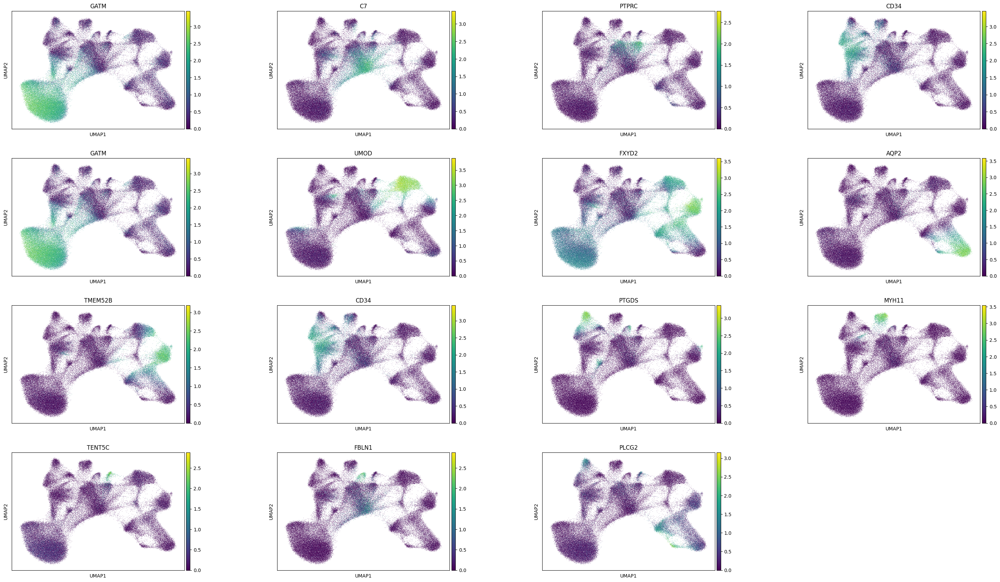

In [22]:
sc.pl.umap(
    adata,
    color=marker,
    wspace=0.4,
)

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


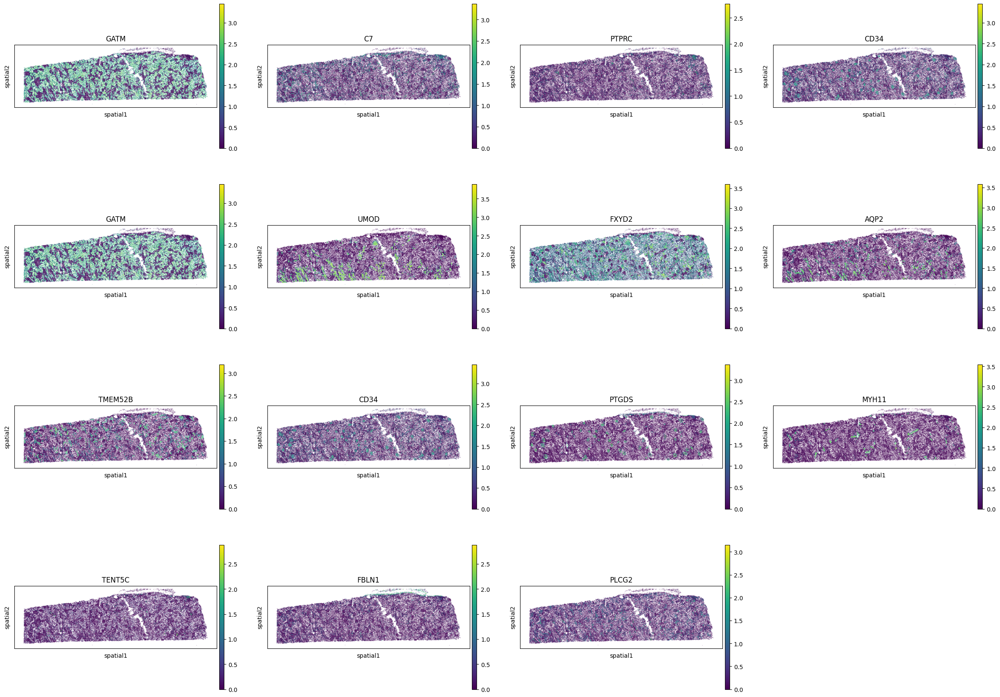

In [25]:
sc.pl.spatial(
    adata,
    color=marker,
    use_raw=False,)

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


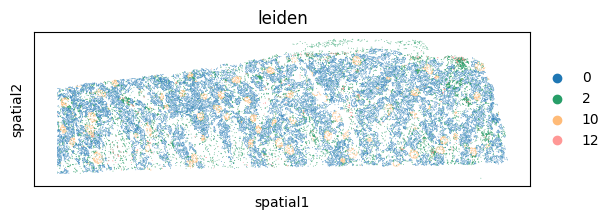

In [27]:
subset = adata[adata.obs["leiden"].isin(["0","2", "10", "12"])]
sc.pl.spatial(
    subset,
    color="leiden")

/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/tbleckwehl/Library/Python/3.9/lib/python/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


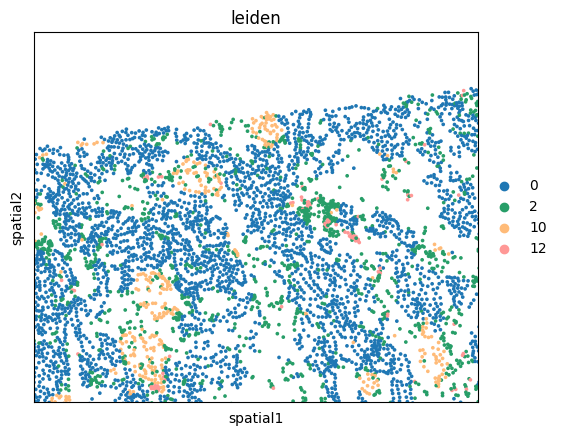

In [29]:
sc.pl.spatial(
    subset,
    color=['leiden'],
    wspace=0.4, crop_coord=[200,2000,500,2000])

In [ ]:
adata_spatial_neighbor = sq.gr.spatial_neighbors(
    adata, coord_type="generic", delaunay=True)

In [ ]:
sq.gr.centrality_scores(adata, cluster_key="leiden")

In [ ]:
sq.pl.centrality_scores(adata, cluster_key="leiden", figsize=(8, 5))